# ICA-ML — Separação Cega de Fontes
### Imagens · Distribuições · Áudio — grade completa por run

## Pipeline

`io → assess → preprocess → ica → postprocess → evaluate` (orquestrado por `harness`)

**Modelo:** $x = As$, $A$ quadrada desconhecida invertível &nbsp;·&nbsp; **objetivo:** $B\approx A^{-1}$, $y=Bx\approx s$

**Verossimilhança:** $\frac{1}{T}\log L(B) \to \sum_i E\{\log\tilde p_i(b_i^Tx)\} + \log|\det B|$

**Score:** $g_i=(\log\tilde p_i)'$ &nbsp;·&nbsp; $g_+(y)=-2\tanh(y)$ (super) &nbsp;·&nbsp; $g_-(y)=\tanh(y)-y$ (sub)

**Chaveamento:** $m_i = E\{-\tanh(y_i)y_i + (1-\tanh^2(y_i))\}$, $m_i>0 \Rightarrow$ super

| Algoritmo | Update | Custo/iter | Convergência | $\mu$ |
|---|---|---|---|---|
| Bell-Sejnowski | $\Delta B \propto [B^T]^{-1} + E\{g(y)x^T\}$ | $O(n^3)$ | linear (lenta) | manual |
| Gradiente Natural | $B\leftarrow B+\mu[I+E\{g(y)y^T\}]B$ | $O(n^2)$ | linear | manual |
| FastICA-ML | $B\leftarrow B+\text{diag}(\alpha_i)[\text{diag}(\beta_i)+E\{g(y)y^T\}]B$ | $O(n^2)$ | quadrática | livre |

**Infomax ≡ ML** quando a ativação $\varphi_i$ = CDF da fonte (`.claude/skills/ica-ml/references/infomax-equivalence.md`).

## Testes estatísticos pré-BSS (`assess/`)

Rodam **sobre as misturas** — com **uma exceção**: a dependência residual (não-linearidade) só é confiável medida **pós-ICA**, sobre as fontes já separadas (nunca sobre dados apenas branqueados, que ainda são dependentes em ordem superior mesmo quando a mistura é linear).

| Teste/estatística | Roda sobre | O que é | Por quê |
|---|---|---|---|
| K² D'Agostino-Pearson · Jarque-Bera · Anderson-Darling | mistura | distância à normalidade de cada canal | TLC: mistura de fontes independentes gaussianiza → quanto mais a mistura **rejeita** a normalidade, mais estrutura sobra para a ICA explorar (viabilidade) |
| Assimetria $\gamma_1$ · curtose exc. $\gamma_2$ | mistura | impressão de forma da distribuição | $\gamma_2$ decide super ($>0$) vs. sub ($<0$) gaussiana — mesmo sinal usado no chaveamento adaptativo da ICA-ML |
| Negentropia $J(y)$ | mistura | não-gaussianidade robusta a outliers | é o próprio contraste que o FastICA maximiza — une a estatística à otimização |
| Dependência residual (`\|corr(\|y_i\|,\|y_j\|)\|` etc.) | **fontes separadas (pós-ICA)** | o quanto ainda sobra de dependência entre componentes | mistura linear ⟹ a melhor ICA atinge independência; sobra ⟹ sinal de mistura não-linear |
| Defeito de diagonalização conjunta | mistura branqueada (pré-ICA) | pré-screen mais barato da não-linearidade (estilo JADE) | corrobora o teste acima antes mesmo de rodar a ICA completa |
| GCC-PHAT (só áudio) | mistura | atraso entre canais | mistura instantânea ⟹ pico da correlação cruzada em lag 0; deslocado ⟹ atraso de propagação (viola o modelo) |

## Métricas pós-separação (`evaluate/`)

Calculadas **sobre as fontes recuperadas**, contra o gabarito (já liberado). Cada componente recuperada é casada à fonte verdadeira mais correlacionada pelo **casamento húngaro** antes de comparar.

**O que é o casamento húngaro, e quando ele entra:** a ICA nunca garante a ordem das componentes recuperadas (ambiguidade de permutação) — então, para comparar "componente $i$" a "fonte verdadeira $j$", primeiro é preciso decidir qual $j$ cada $i$ representa. O casamento húngaro resolve esse problema de atribuição ótima (1-para-1, sem repetição): custo $C_{ij}=1-|corr(y_i,s_j)|$, resolvido por `scipy.optimize.linear_sum_assignment`. Ele é usado **somente para pontuar** (estas métricas) e para reagrupar planos R/G/B (modo B de imagem) — **nunca** para reordenar a figura-vitrine, que sempre mostra a ordem "crua" resolvida às cegas pela ICA.

| Métrica | Fórmula (essência) | Mede |
|---|---|---|
| Amari | $G=BA$; desvio de permutação×escala | vazamento entre fontes |
| SIR/SDR/SI-SDR (dB) | $10\log_{10}(\|s_{alvo}\|^2/\|erro\|^2)$ | razão sinal/interferência |
| PSNR/SSIM | $10\log_{10}(MAX^2/MSE)$ + estrutura local | fidelidade de imagem |
| KS/Anderson-Darling | $\sup_x\vert F_n(x)-F(x)\vert$ | ajuste à distribuição |
| Identificação de família | MLE + KS, 6 candidatas | classifica a fonte recuperada |

In [1]:
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
from IPython.display import Image, Markdown, display

from ica.data.image_template import ImageTemplate
from ica.harness import run_grid, select_best
from ica.postprocessing.matching import hungarian_match
from ica.visualization import ShowcaseVisualizer

warnings.filterwarnings("ignore")
pd.set_option("display.precision", 4)

DATA_ROOT = Path("..") / "data" / "mix"
GROUNDTRUTH_ROOT = Path("..") / "data" / "groundtruth"
OUTPUT_ROOT = Path("..") / "output" / "relatorio"

In [2]:
def _numeric_metrics(metrics):
    return {
        name: float(value)
        for name, value in metrics.items()
        if isinstance(value, (int, float, np.floating)) and np.isfinite(value)
    }


def _grid_comparison_table(cells):
    """1 linha por (algoritmo, modo): log-L/amostra, Amari, iterações, tempo."""
    rows = []
    for cell in sorted(cells, key=lambda c: (c.algorithm, c.mode)):
        rows.append({
            "algoritmo": cell.algorithm,
            "modo": cell.mode,
            "log-L/amostra": cell.log_likelihood_per_sample,
            "Amari": cell.metrics.get("amari_index"),
            "iterações": cell.metrics.get("convergence_iterations"),
            "tempo (s)": cell.metrics.get("execution_time_seconds"),
        })
    return pd.DataFrame(rows).set_index(["algoritmo", "modo"])


def _assessment_table(report):
    """1 linha por canal de mistura: gaussianidade + impressão HOS."""
    rows = []
    for i, channel in enumerate(report.channels):
        rows.append({
            "canal": i + 1,
            "K² (estat.)": channel.gaussianity.dagostino_pearson_statistic,
            "K² (p)": channel.gaussianity.dagostino_pearson_pvalue,
            "AD (estat.)": channel.gaussianity.anderson_darling_statistic,
            "assimetria": channel.higher_order.skewness,
            "curtose exced.": channel.higher_order.excess_kurtosis,
            "negentropia": channel.higher_order.negentropy_contrast,
            "aprox. gaussiana?": channel.is_gaussian_like,
        })
    return pd.DataFrame(rows).set_index("canal")


def _print_assessment_summary(report):
    """Resumo textual: gaussianidade+HOS rodam sobre as MISTURAS; nao-linearidade
    roda sobre as FONTES SEPARADAS (pos-ICA) -- ver secao 'Testes pre-BSS' acima.
    """
    nl = report.nonlinearity
    print(
        f"viabilidade={report.viability_flag} "
        f"({report.n_gaussian_like_channels}/{len(report.channels)} aprox. gaussianas)"
        f"  |  não-linearidade (pós-ICA): max_dep={nl.max_residual_dependence:.4f} "
        f"({'suspeita' if nl.is_likely_nonlinear else 'ok'})"
        f"  |  defeito diag. conjunta (pré-ICA)={report.joint_diagonalization_defect:.4f}"
    )
    if report.delay_lags is not None:
        print(f"lags GCC-PHAT (amostras):\n{report.delay_lags}")


def _family_table(winner):
    """Classificação/categorização das saídas OBTIDAS (ordem de model.sources_)."""
    family = winner.metrics.get("family_identification_per_source")
    if not family:
        return None
    rows = [
        {
            "componente obtida": i + 1,
            "família estimada": fit.best.name,
            "KS do ajuste": fit.best.ks_statistic,
        }
        for i, fit in enumerate(family)
    ]
    return pd.DataFrame(rows).set_index("componente obtida")


def _obtained_index_by_true(winner, true_composites=None):
    """Mapa {indice da fonte verdadeira -> indice do componente obtido} (1-indexados).

    Usa o mesmo casamento hungaro que ja pontua as metricas (nunca reordena nada,
    so serve para pontuar/cruzar), so para expor qual \"obtido N\" da vitrine
    corresponde a cada \"fonte esperada M\" da tabela -- sem isso, a tabela
    (indexada pela fonte verdadeira) e a vitrine (indexada pelo componente obtido)
    sao dificeis de cruzar sempre que a permutacao nao e a identidade (o caso normal,
    ja que a ICA permuta livremente).
    """
    if winner.rgb_composites is not None:
        if not true_composites:
            return {}
        true_flat = np.array([c.reshape(-1) for c in true_composites])
        estimated_flat = np.array([c.reshape(-1) for c in winner.rgb_composites])
        match = hungarian_match(true_flat, estimated_flat)
    elif winner.model.sources_true_ is not None:
        match = hungarian_match(winner.model.sources_true_, winner.model.sources_)
    else:
        return {}
    return {
        int(ref_idx) + 1: int(matched_idx) + 1
        for ref_idx, matched_idx in zip(match.reference_indices, match.matched_indices)
    }


def _matched_metrics_table(winner, obtained_index_by_true):
    """Métricas de validação por FONTE VERDADEIRA casada (KS/AD, PSNR/SSIM, SIR/SDR).

    Indexadas pela ordem do gabarito (convenção das baterias em ica.metrics), por
    isso ficam numa tabela separada de _family_table (indexada pela ordem obtida).
    A coluna "componente obtida" (de obtained_index_by_true) mostra a qual coluna
    "obtido N" da vitrine cada linha corresponde.
    """
    metrics = winner.metrics
    dist_fit = metrics.get("distribution_fit_per_source")
    sir_sdr = metrics.get("sir_sdr_per_source")
    psnr_arr = metrics.get("psnr_db_per_source")
    ssim_arr = metrics.get("ssim_per_source")
    n = len(dist_fit or sir_sdr or (psnr_arr if psnr_arr is not None else []))
    if n == 0:
        return None
    rows = []
    for i in range(n):
        row = {
            "fonte esperada": i + 1,
            "componente obtida": obtained_index_by_true.get(i + 1),
        }
        if dist_fit is not None:
            row["KS"] = dist_fit[i].ks_statistic
            row["AD"] = dist_fit[i].anderson_darling_statistic
        if psnr_arr is not None:
            row["PSNR (dB)"] = psnr_arr[i]
        if ssim_arr is not None:
            row["SSIM"] = ssim_arr[i]
        if sir_sdr is not None:
            row["SIR (dB)"] = sir_sdr[i].sir_db
            row["SDR (dB)"] = sir_sdr[i].sdr_db
            row["SI-SDR (dB)"] = sir_sdr[i].si_sdr_db
        rows.append(row)
    return pd.DataFrame(rows).set_index("fonte esperada")


def run_and_show(sample, run, sample_size=None, max_iterations=500, max_workers=None):
    """Roda a grade completa de (sample, run): estatística+classificação -> resultados+métricas."""
    data_root = DATA_ROOT / sample
    groundtruth_root = GROUNDTRUTH_ROOT / sample
    output_dir = OUTPUT_ROOT / sample / run
    output_dir.mkdir(parents=True, exist_ok=True)

    display(Markdown(f"### `{sample}/{run}`"))

    cells = run_grid(
        sample, run, data_root, groundtruth_root,
        sample_size=sample_size, max_workers=max_workers, max_iterations=max_iterations,
    )
    winner = select_best(cells)

    image_data, true_composites = None, None
    if winner.rgb_composites is not None:
        image_data = ImageTemplate(run=run, data_root=data_root)
        image_data.load()
        if groundtruth_root.exists():
            _, sources_true = image_data.load_ground_truth(groundtruth_root)
            if sources_true is not None:
                n = sources_true.shape[0] // 3
                true_composites = [sources_true[3 * i : 3 * i + 3] for i in range(n)]

    # -- 1. testes estatísticos + classificação/categorização --
    display(Markdown("**Testes estatísticos (`assess/`) e classificação**"))
    report = winner.model.assess()
    display(_assessment_table(report))
    _print_assessment_summary(report)
    family_table = _family_table(winner)
    if family_table is not None:
        display(family_table)

    # -- 2. resultados + comparação de métricas --
    display(Markdown("**Resultados e comparação de métricas**"))
    display(_grid_comparison_table(cells))
    print(f"vencedor: {winner.algorithm}/{winner.mode}")
    obtained_index_by_true = _obtained_index_by_true(winner, true_composites)
    matched_table = _matched_metrics_table(winner, obtained_index_by_true)
    if matched_table is not None:
        display(matched_table)

    visualizer = ShowcaseVisualizer(
        data=(image_data if winner.rgb_composites is not None else winner.model.data),
        metrics=_numeric_metrics(winner.metrics),
    )
    if winner.rgb_composites is not None:
        paths = visualizer.plot_rgb_composites(
            winner.rgb_composites,
            height=image_data.height_ or 0,
            width=image_data.width_ or 0,
            output_dir=output_dir,
            true_composites=true_composites,
        )
    else:
        paths = visualizer.plot(winner.model, output_dir)
    for path in paths:
        if path.suffix == ".png":
            display(Image(filename=str(path)))

    conv_path = visualizer.plot_convergence_comparison(
        cells, mode=winner.mode, output_dir=output_dir
    )
    display(Image(filename=str(conv_path)))

    return winner, cells

## Domínio: imagens

**Modos de condicionamento (imagem colorida):**

- **Modo A** — escala de cinza: 1 problema de ICA (n imagens × n pixels). Único modo possível quando a imagem não é RGB.
- **Modo B** — RGB por plano: **3 problemas de ICA independentes** (um por plano R, G, B), cada um com sua própria ambiguidade de permutação/sinal; os planos são reagrupados por **correlação espacial** depois da separação (as versões R/G/B de uma mesma imagem-fonte são espacialmente muito correlacionadas entre si).
- **Modo C** — RGB achatado: **1 único problema de ICA** sobre vetores de $3P$ (R, G, B concatenados por imagem).

`run1` (cinza, modo A) · `run3` (RGB, modos B e C, comparados na grade).

### `imagens/run1`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,1160.4634,1.0199e-252,139.0254,0.6743,0.5444,0.0035,False
2,477.7026,1.8544e-104,69.5982,-0.3992,-0.2808,0.0012,True
3,787.6708,9.1086e-172,48.4705,-0.5108,0.6069,0.0007,False


viabilidade=viavel (1/3 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0808 (ok)  |  defeito diag. conjunta (pré-ICA)=0.1609


,família estimada,KS do ajuste
componente obtida,,
1,laplaciana,0.1030
2,qui-quadrado,0.0305
3,laplaciana,0.0422


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,A,-2.7844,0.2129,300.0,1.2616
fastica_ml,A,-2.8876,0.4977,45.0,0.2179
natural_gradient,A,-2.8990,0.2075,300.0,1.3302


vencedor: bell_sejnowski/A


,componente obtida,PSNR (dB),SSIM,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,,,
1,3,26.7509,0.9253,-12.5996,-13.0663,1.5990
2,1,32.5802,0.9757,28.5637,24.0718,25.2430
3,2,30.1708,0.9642,32.9833,24.2201,24.4025


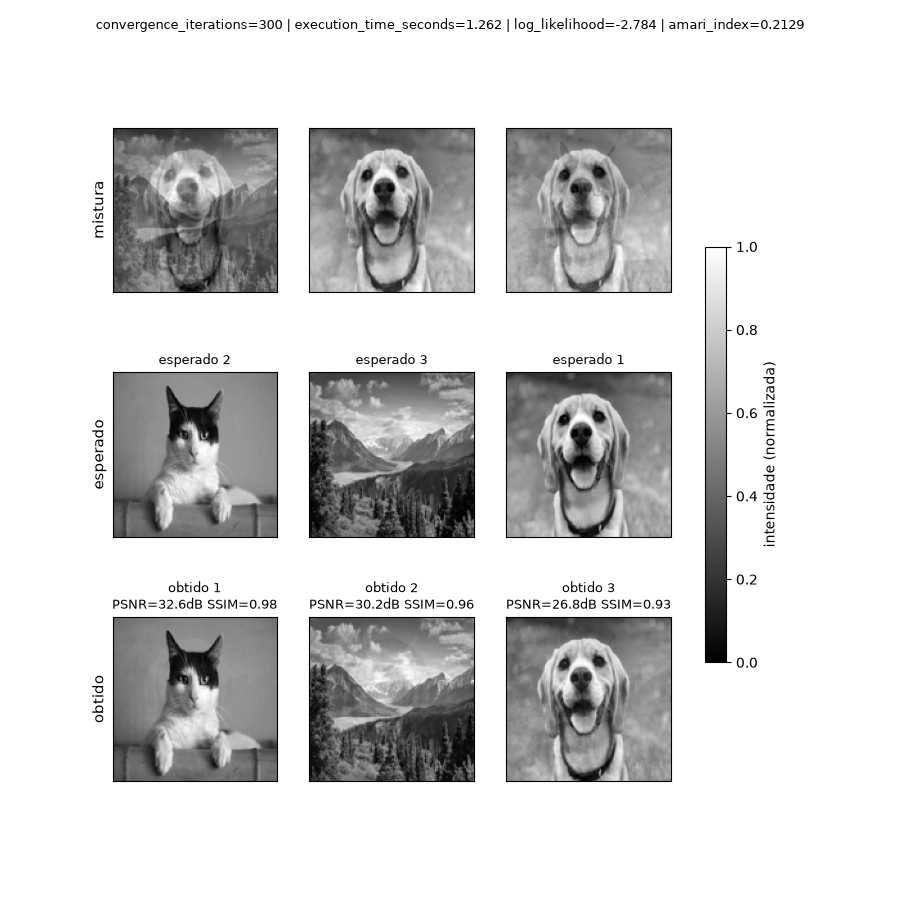

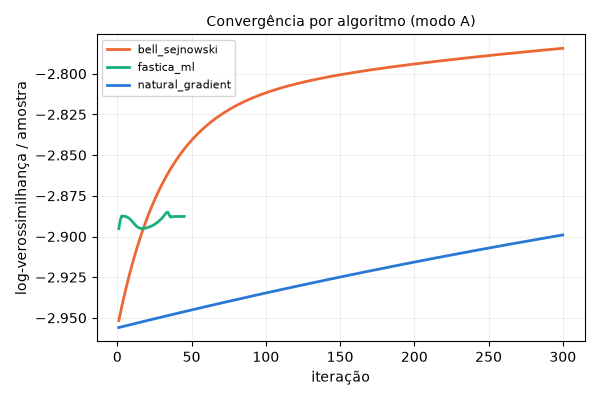

In [3]:
imagens_run1 = run_and_show("imagens", "run1", max_iterations=300)

### `imagens/run3`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,2495.2060,0.0,490.3866,-0.3024,-0.6221,0.0050,False
2,1904.2040,0.0,232.0637,-0.3848,-0.4646,0.0031,False
3,7761.7726,0.0,4369.8514,1.2129,0.1984,0.0001,True


viabilidade=viavel (1/3 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0758 (ok)  |  defeito diag. conjunta (pré-ICA)=0.2389


**Resultados e comparação de métricas**

log-L/amostra Amari        iterações  tempo (s)
algoritmo        modo                                                 
bell_sejnowski   B           -2.2904  None  [300, 300, 300]     4.4582
                 C           -1.3590  None            300.0     5.8980
fastica_ml       B           -2.4411  None      [24, 24, 8]     0.3150
                 C           -1.6256  None            300.0     5.8300
natural_gradient B           -2.4036  None  [300, 300, 300]     4.5963
                 C           -1.5272  None            300.0     5.9986

vencedor: bell_sejnowski/C


,componente obtida,PSNR (dB),SSIM
fonte esperada,,,
1,3,10.0353,0.2224
2,2,10.9935,0.3721
3,1,13.4332,0.4203


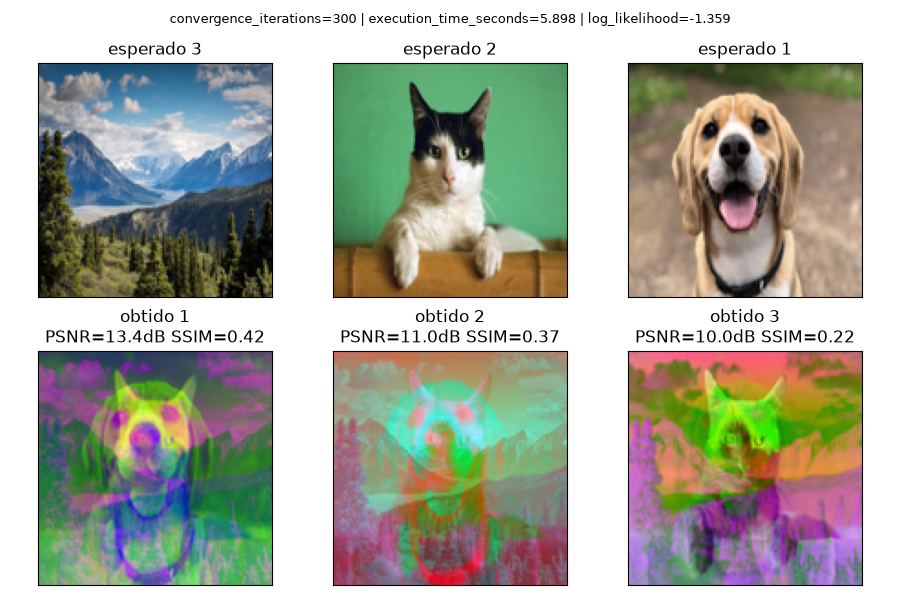

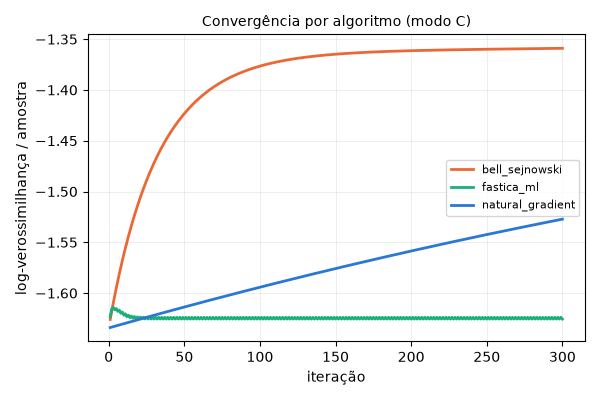

In [4]:
imagens_run3 = run_and_show("imagens", "run3", max_iterations=300)

## Domínio: distribuições
9 runs · `sample_size=1000` (grade rápida; estudo de $T$ é deferido) · `run8`: outliers extremos → `RobustScaling`.

### `dist/run1`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,27.7237,9.5470e-07,0.8515,0.2194,0.9562,0.0030,False
2,326.0616,1.5726e-71,7.7037,-0.0142,-1.0779,0.0197,False
3,28.9259,5.2340e-07,1.9579,-0.0276,-0.5855,0.0049,False


viabilidade=viavel (0/3 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0264 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0422


,família estimada,KS do ajuste
componente obtida,,
1,laplaciana,0.0214
2,uniforme,0.0582
3,gaussiana,0.0178


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-2.7714,0.2081,500.0,0.1565
fastica_ml,unico,-2.9327,0.2621,6.0,0.0025
natural_gradient,unico,-2.8459,0.2168,500.0,0.1558


vencedor: bell_sejnowski/unico


,componente obtida,KS,AD,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,,,
1,2,0.068,10.4450,18.4320,18.4267,18.4743
2,3,0.023,-0.8847,11.5251,11.4927,11.4728
3,1,0.077,10.4488,11.0910,11.0901,11.0583


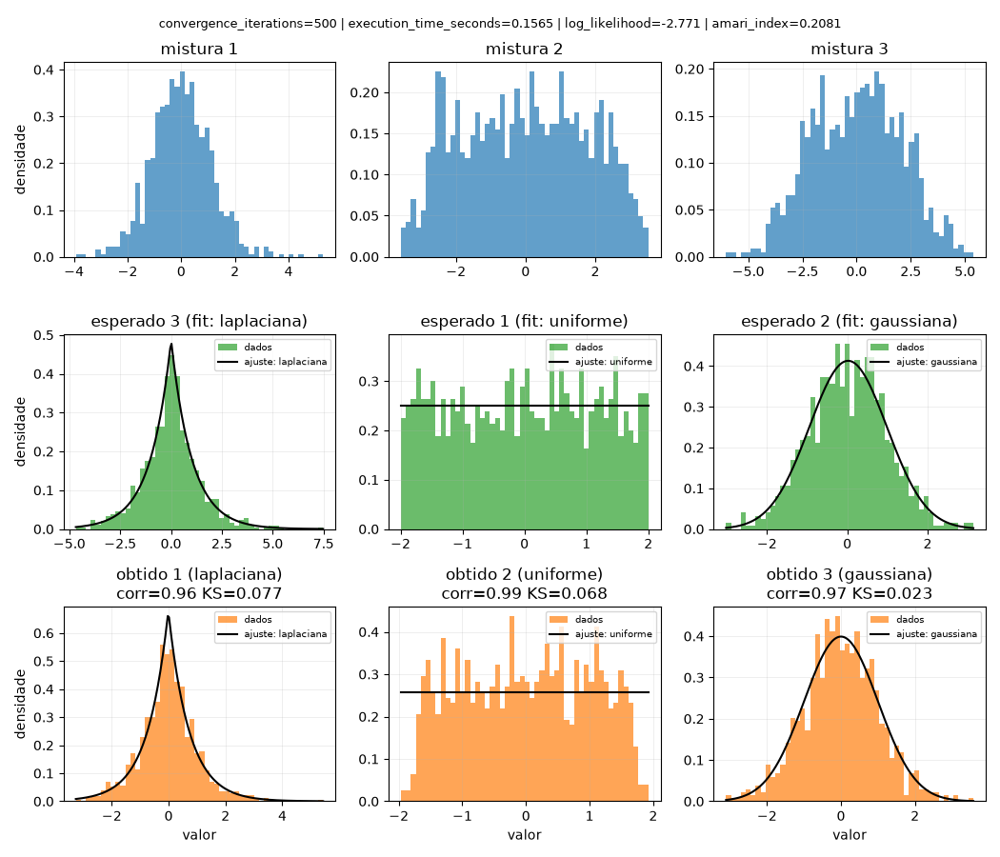

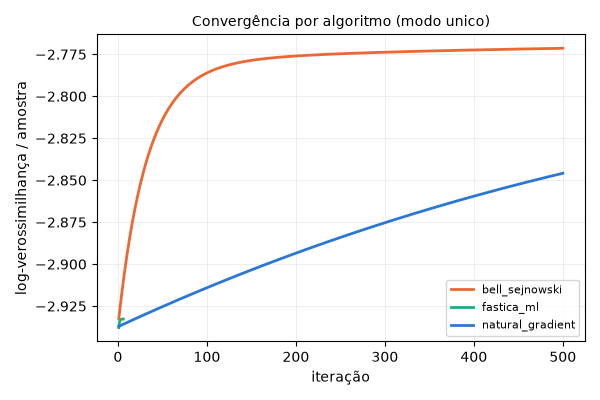

In [5]:
dist_run1 = run_and_show("dist", "run1", sample_size=1000, max_iterations=500)

### `dist/run2`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,4.0664,1.3092e-01,0.5332,0.0154,-0.2797,0.0009,True
2,383.1462,6.3220e-84,8.5342,-0.0150,-1.1053,0.0215,False
3,78.9930,7.0287e-18,3.8663,0.0450,-0.7934,0.0095,False


viabilidade=viavel (1/3 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0610 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0227


,família estimada,KS do ajuste
componente obtida,,
1,gaussiana,0.0588
2,gaussiana,0.0215
3,gaussiana,0.0194


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,0.0233,0.2681,500.0,0.1549
fastica_ml,unico,-0.3589,0.2082,500.0,0.1787
natural_gradient,unico,-0.1317,0.2751,500.0,0.1555


vencedor: bell_sejnowski/unico


,componente obtida,KS,AD,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,,,
1,1,0.075,10.9343,16.0671,16.0667,16.1028
2,2,0.041,-0.1607,8.0621,7.9719,7.9530
3,3,0.019,-1.0184,7.2204,7.2153,7.1980


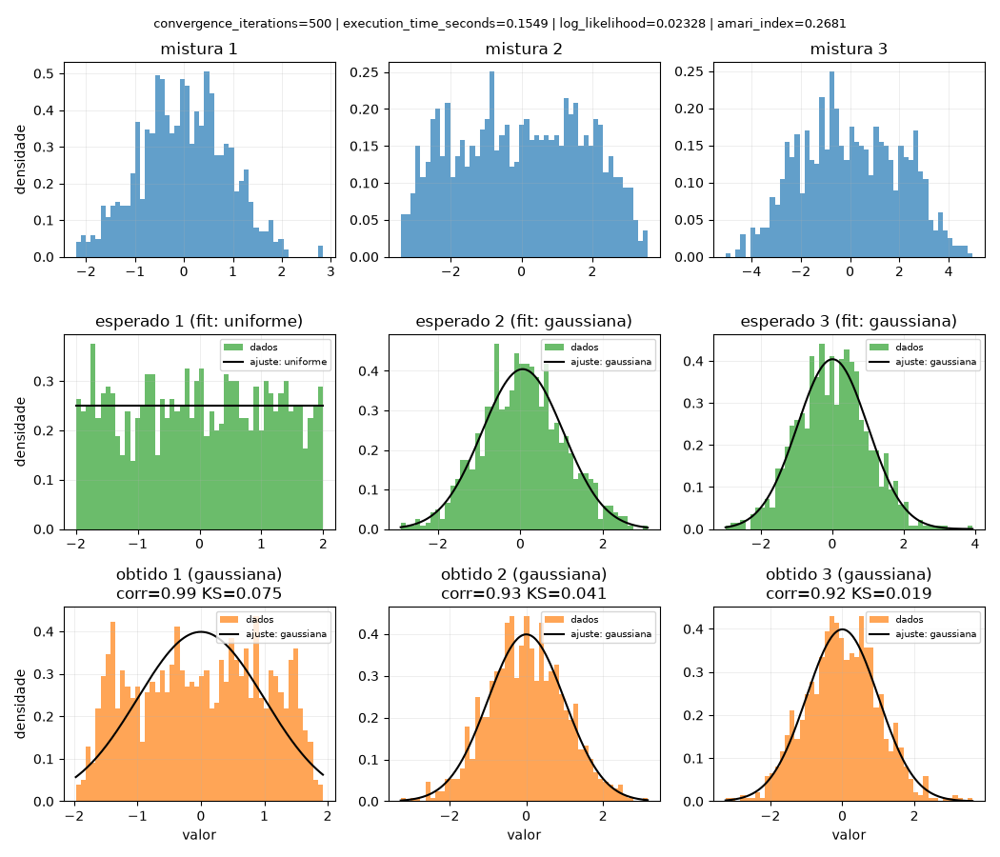

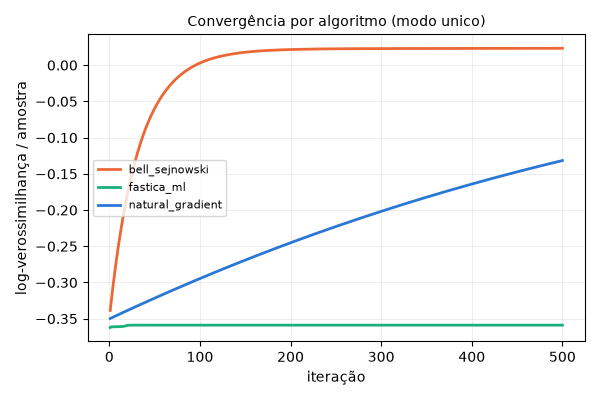

In [6]:
dist_run2 = run_and_show("dist", "run2", sample_size=1000, max_iterations=500)

### `dist/run3`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,0.5963,7.4218e-01,0.2213,0.0310,-0.1119,9.8011e-05,True
2,425.9529,3.2025e-93,8.9772,-0.0172,-1.1224,2.2052e-02,False
3,151.5841,1.2132e-33,5.0430,0.0050,-0.9316,1.3912e-02,False


viabilidade=viavel (1/3 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0807 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0850


,família estimada,KS do ajuste
componente obtida,,
1,gaussiana,0.0610
2,gaussiana,0.0147
3,qui-quadrado,0.0269


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,0.0257,0.2724,500.0,0.1510
fastica_ml,unico,-1.6656,0.5160,77.0,0.0274
natural_gradient,unico,-0.1304,0.2657,500.0,0.1525


vencedor: bell_sejnowski/unico


,componente obtida,KS,AD,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,,,
1,1,0.069,9.6819,15.3293,15.2311,15.2281
2,3,0.603,501.4151,5.6767,-5.8516,-5.8268
3,2,0.027,-0.6437,12.6222,9.9870,9.9757


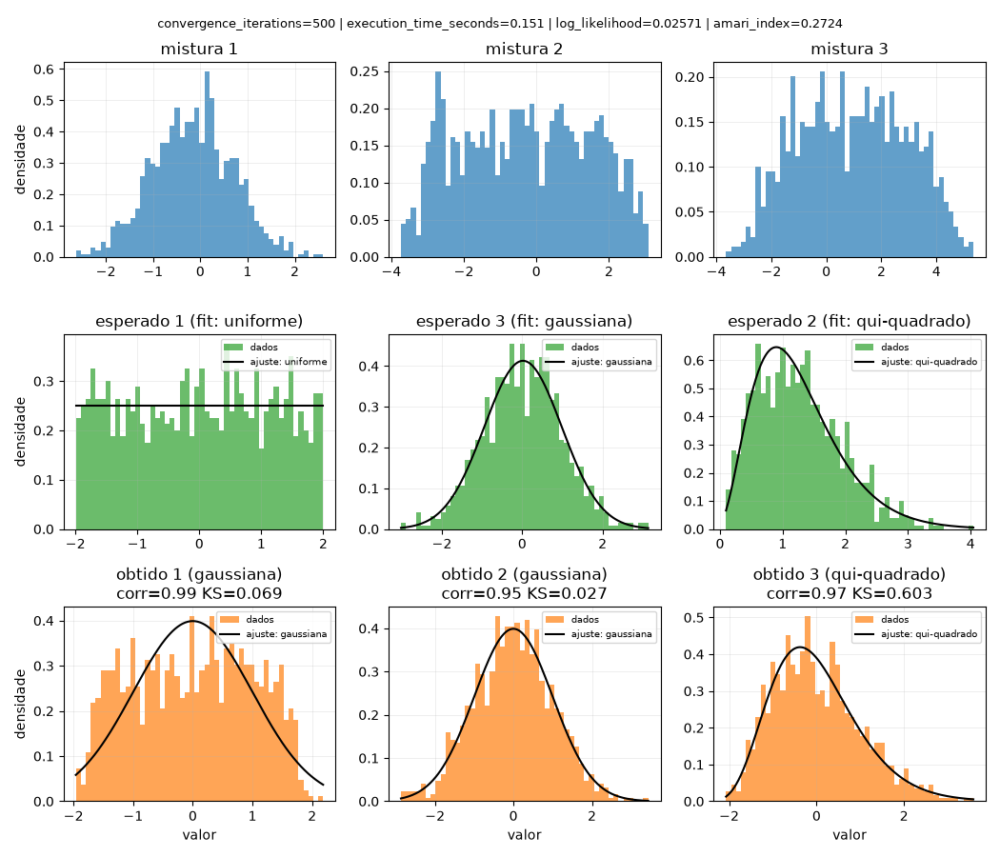

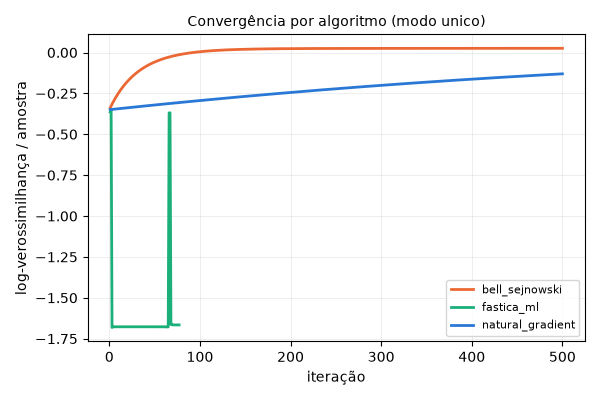

In [7]:
dist_run3 = run_and_show("dist", "run3", sample_size=1000, max_iterations=500)

### `dist/run4`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,122.2445,2.8506e-27,6.3795,-0.4376,3.7406,0.0302,False
2,44.9050,1.7742e-10,4.0590,0.5332,0.2418,0.0001,True
3,106.2261,8.5760e-24,11.7969,-0.8047,0.9745,0.0050,False
4,157.4444,6.4772e-35,14.3937,-1.0307,1.3487,0.0062,False
5,4.6129,9.9613e-02,0.8872,-0.1043,0.2691,0.0006,True


viabilidade=viavel (2/5 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.1142 (suspeita)  |  defeito diag. conjunta (pré-ICA)=0.0514


,família estimada,KS do ajuste
componente obtida,,
1,laplaciana,0.0255
2,rayleigh,0.0642
3,gaussiana,0.0556
4,gaussiana,0.0245
5,qui-quadrado,0.0123


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-5.5774,0.2402,500.0,0.2623
fastica_ml,unico,-5.7827,0.3785,500.0,0.2710
natural_gradient,unico,-5.6832,0.2688,500.0,0.2532


vencedor: bell_sejnowski/unico


,componente obtida,KS,AD,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,,,
1,3,0.072,9.0936,14.3600,13.8977,13.9016
2,5,0.610,517.8582,-0.1625,-1.4222,-7.7335
3,4,0.036,-0.6721,4.0461,2.8064,2.6372
4,1,0.080,10.6223,13.5366,9.8261,9.8656
5,2,0.771,833.1632,2.8601,0.3445,-3.9424


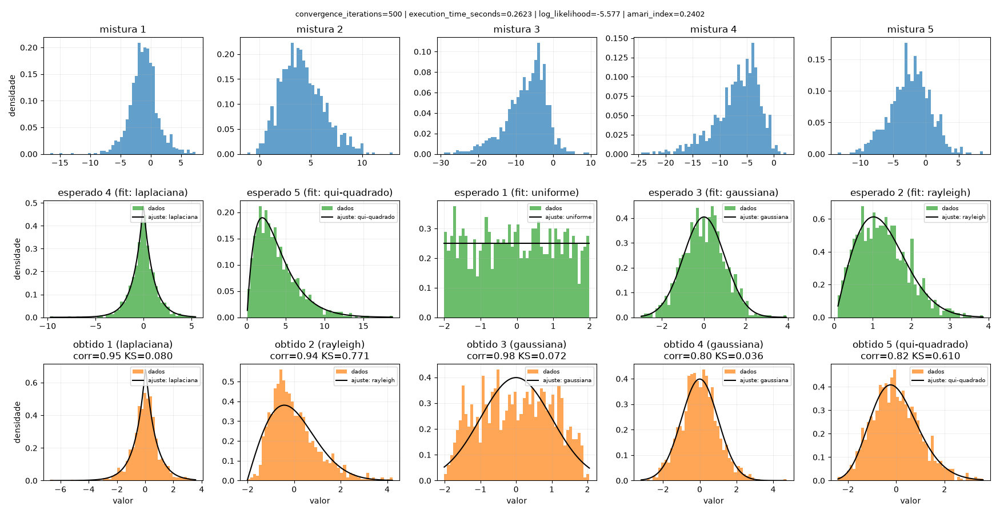

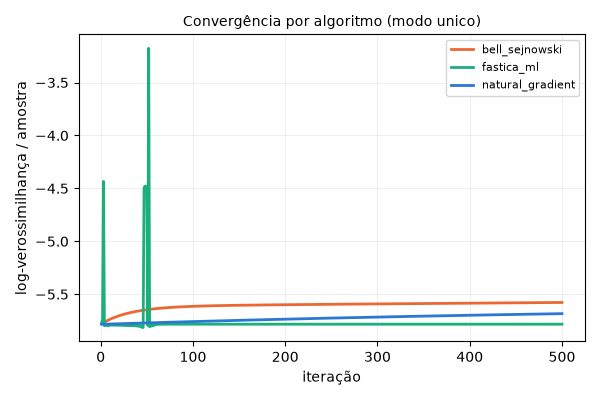

In [8]:
dist_run4 = run_and_show("dist", "run4", sample_size=1000, max_iterations=500)

### `dist/run5`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,232.3141,3.5780e-51,15.7252,1.2413,2.6602,0.0088,False
2,52.9998,3.0991e-12,5.5958,0.4613,0.9726,0.0055,False
3,100.6815,1.3718e-22,4.9628,-0.7038,1.3702,0.0057,False
4,23.4759,7.9848e-06,1.3752,-0.2010,0.8506,0.0035,False


viabilidade=viavel (0/4 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0824 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0524


,família estimada,KS do ajuste
componente obtida,,
1,rayleigh,0.0574
2,laplaciana,0.0151
3,gaussiana,0.0340
4,qui-quadrado,0.0263


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-4.2112,0.4034,500.0,0.1951
fastica_ml,unico,-3.0117,0.4420,18.0,0.0084
natural_gradient,unico,-4.2990,0.4308,500.0,0.1921


vencedor: fastica_ml/unico


,componente obtida,KS,AD,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,,,
1,3,0.082,11.8068,10.1503,2.7379,2.7656
2,4,0.592,493.4303,1.2815,-2.5244,-7.3434
3,2,0.078,9.0630,23.6337,15.8510,15.8617
4,1,0.771,842.9763,2.1285,1.2950,-3.4258


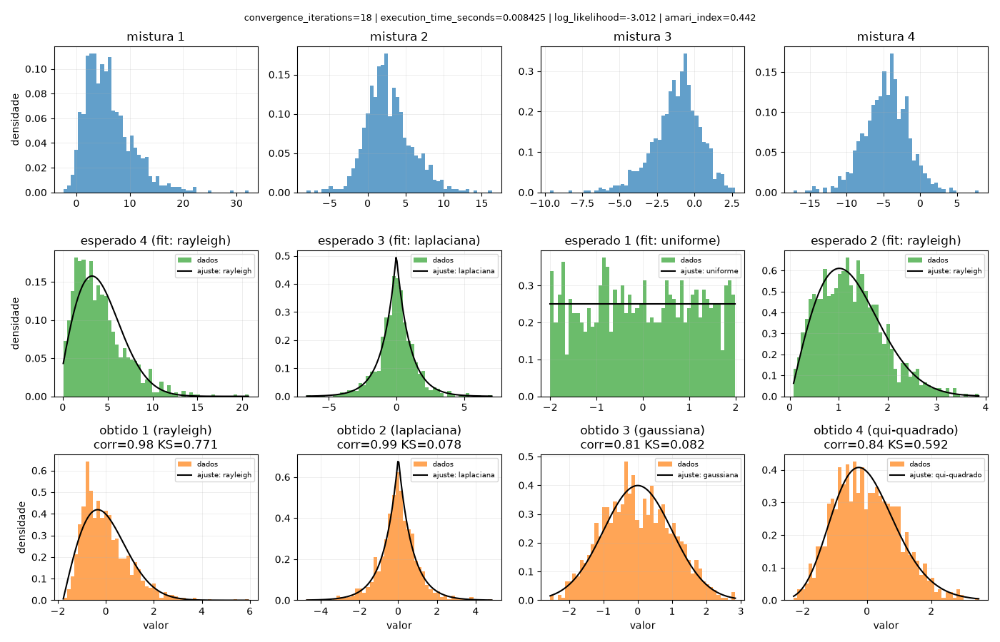

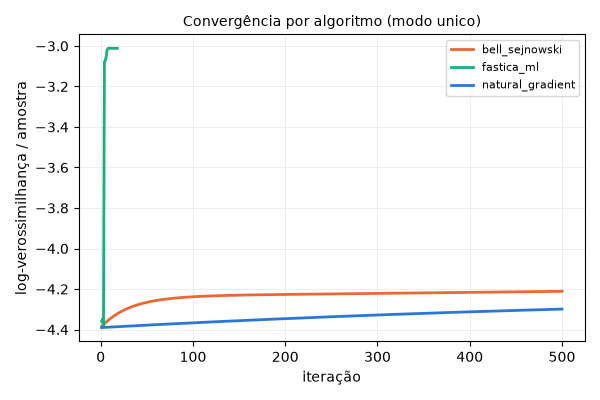

In [9]:
dist_run5 = run_and_show("dist", "run5", sample_size=1000, max_iterations=500)

### `dist/run6`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,5222.0983,0.0000e+00,47.5379,0.0122,-1.6440,0.0720,False
2,657.5291,1.6572e-143,198.1497,-3.0650,9.9664,0.2589,False
3,13000.2541,0.0000e+00,22.1205,0.0333,-1.4053,0.0435,False
4,2362.1636,0.0000e+00,17.0142,-0.0044,-1.3053,0.0330,False


viabilidade=viavel (0/4 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0655 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0025


,família estimada,KS do ajuste
componente obtida,,
1,gaussiana,0.1350
2,qui-quadrado,0.1816
3,uniforme,0.0453
4,uniforme,0.0419


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,0.3244,None,500.0,0.1866
fastica_ml,unico,-0.3393,None,3.0,0.0014
natural_gradient,unico,0.0290,None,500.0,0.1795


vencedor: bell_sejnowski/unico


,componente obtida,KS,AD,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,,,
1,1,0.162,28.4887,27.9129,14.1332,14.1212
2,2,0.709,486.9416,31.0602,5.6258,5.6225
3,3,0.086,10.5711,18.9031,10.0673,10.0364
4,4,0.099,13.5182,19.1337,6.3851,6.4080


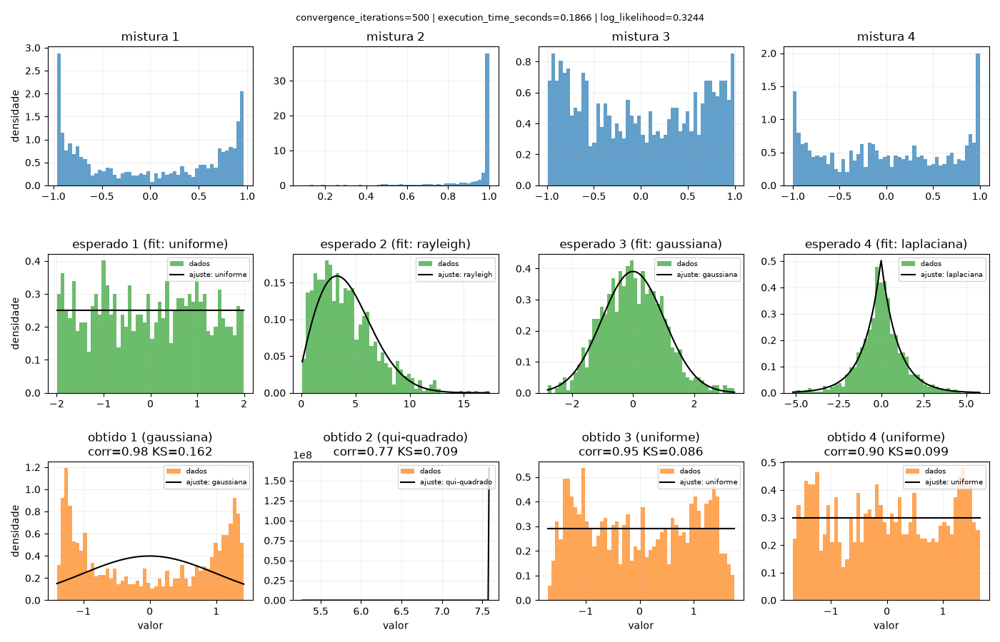

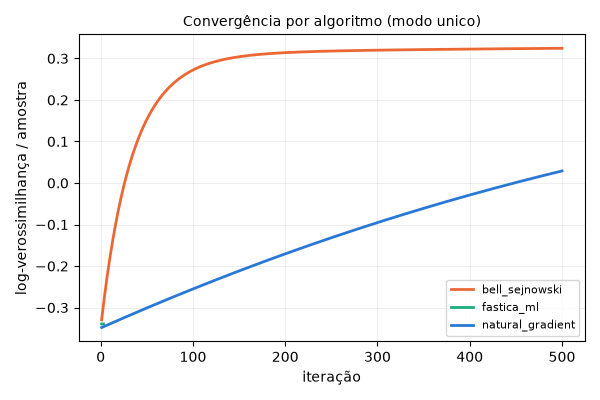

In [10]:
dist_run6 = run_and_show("dist", "run6", sample_size=1000, max_iterations=500)

### `dist/run7`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,228.3656,2.5766e-50,15.1110,1.2321,2.5722,0.0075,False
2,3.6661,1.5992e-01,0.3629,-0.1148,0.1818,0.0004,True
3,98.9948,3.1882e-22,4.2416,-0.6994,1.3370,0.0029,False
4,42.1005,7.2110e-10,1.7724,0.1060,1.6619,0.0068,False


viabilidade=viavel (1/4 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.1047 (suspeita)  |  defeito diag. conjunta (pré-ICA)=0.0108


,família estimada,KS do ajuste
componente obtida,,
1,laplaciana,0.0249
2,qui-quadrado,0.0354
3,qui-quadrado,0.0703
4,gaussiana,0.0178


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-4.1430,0.3832,500.0,0.2046
fastica_ml,unico,-4.3092,0.2755,10.0,0.0050
natural_gradient,unico,-4.2401,0.3179,500.0,0.2009


vencedor: bell_sejnowski/unico


,componente obtida,KS,AD,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,,,
1,3,0.082,11.6916,16.8654,14.6008,14.6050
2,4,0.031,-0.8163,10.2405,9.0052,8.9441
3,1,0.083,8.9893,12.9260,11.2088,11.2531
4,2,0.776,841.5363,4.2857,-3.9575,-4.1935


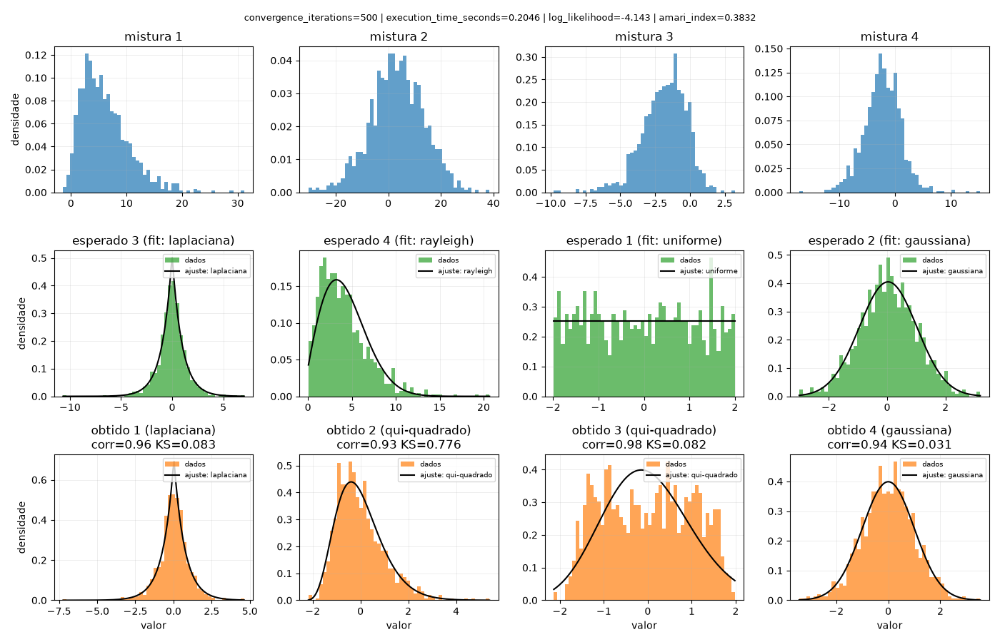

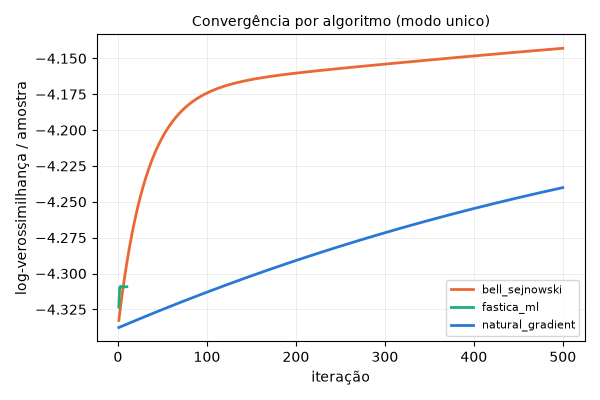

In [11]:
dist_run7 = run_and_show("dist", "run7", sample_size=1000, max_iterations=500)

### `dist/run8`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,196.2477,2.4286e-43,69.4171,1.3315,0.7668,0.0051,False
2,2715.1140,0.0000e+00,384.0837,30.8871,963.8088,1.7908,False
3,667.7115,1.0193e-145,81.5525,2.9875,12.2107,0.1757,False
4,1928.7605,0.0000e+00,312.5526,14.2300,226.4299,1.4093,False
5,1271.6617,7.2806e-277,95.4461,6.4658,77.0679,0.3673,False


viabilidade=viavel (0/5 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.5057 (suspeita)  |  defeito diag. conjunta (pré-ICA)=0.0000


,família estimada,KS do ajuste
componente obtida,,
1,qui-quadrado,0.0718
2,qui-quadrado,0.0801
3,laplaciana,0.1782
4,rayleigh,0.0753
5,exponencial,0.1281


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-0.0515,None,500.0,0.2414
fastica_ml,unico,0.3023,None,13.0,0.0072
natural_gradient,unico,-2.2176,None,500.0,0.2356


vencedor: fastica_ml/unico


,componente obtida,KS,AD,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,,,
1,5,0.333,96.8238,8.3510,3.5344,3.6079
2,4,0.946,989.1923,-2.9580,-5.9215,-1.3605
3,2,0.252,59.1160,9.1626,2.9315,2.7989
4,3,0.245,58.7501,10.0572,2.1296,2.0776
5,1,0.651,539.3465,5.8458,1.1871,-1.8404


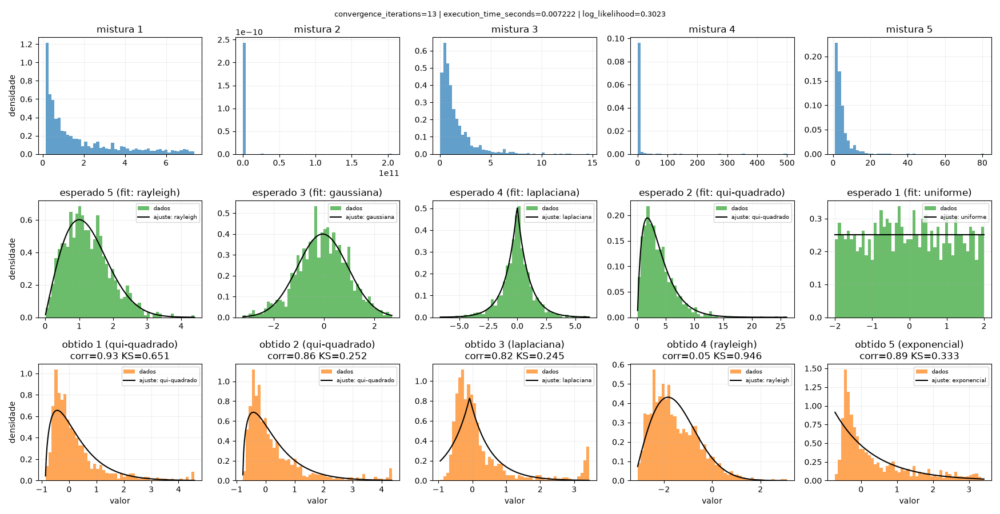

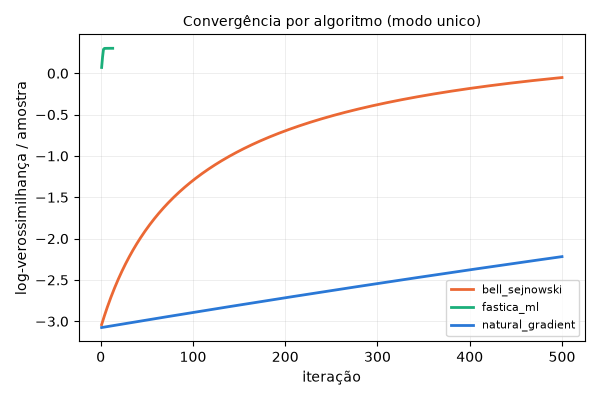

In [12]:
dist_run8 = run_and_show("dist", "run8", sample_size=1000, max_iterations=500)

### `dist/run9`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,603.1139,1.0851e-131,10.9161,0.0635,-1.1739,0.0258,False
2,4926.8937,0.0000e+00,17.9373,0.0056,-1.3375,0.0383,False
3,67.1420,2.6321e-15,2.8361,-0.0519,-0.7582,0.0059,False


viabilidade=viavel (0/3 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.7061 (suspeita)  |  defeito diag. conjunta (pré-ICA)=0.2224


,família estimada,KS do ajuste
componente obtida,,
1,uniforme,0.0520
2,uniforme,0.0586
3,uniforme,0.0299


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,0.1525,0.4558,500.0,0.1411
fastica_ml,unico,-0.2540,0.2509,22.0,0.0073
natural_gradient,unico,-0.0438,0.4726,500.0,0.1412


vencedor: bell_sejnowski/unico


,componente obtida,KS,AD,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,,,
1,1,0.230,70.8198,12.2823,12.2631,12.2578
2,3,0.322,59.1824,-0.5308,-0.5387,-0.8839
3,2,0.216,89.5547,0.1744,0.1448,0.4725


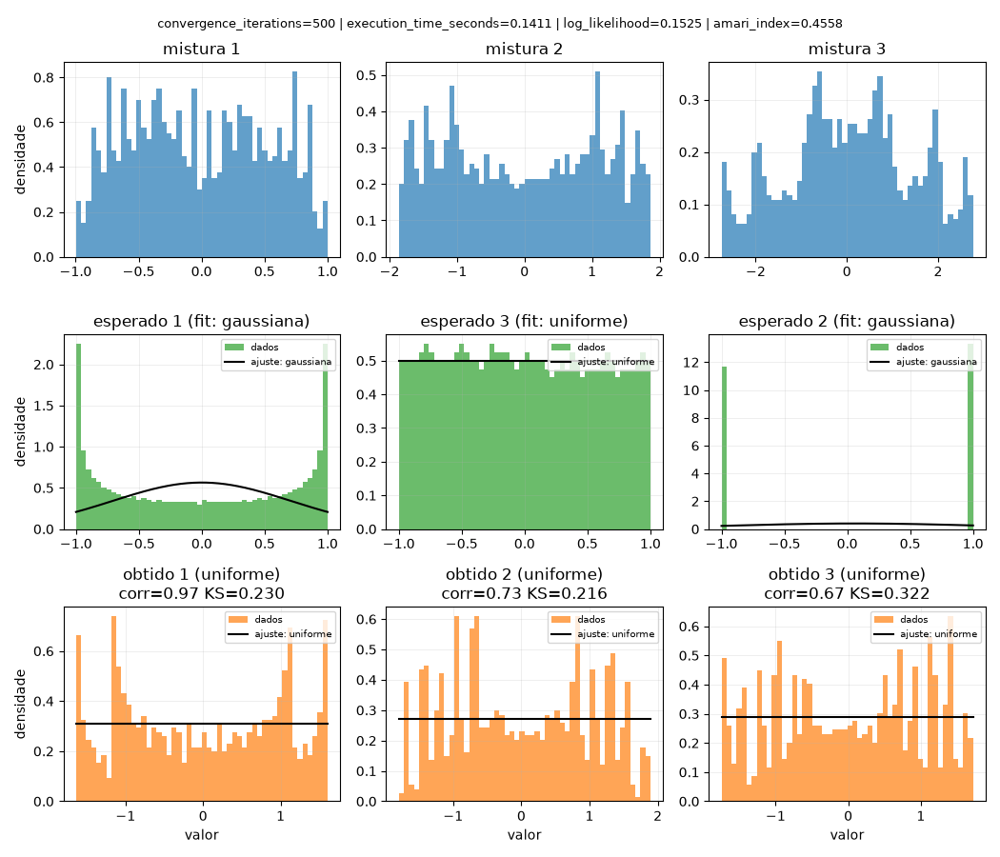

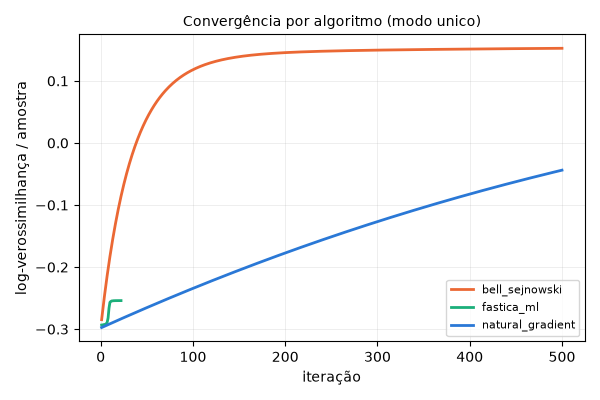

In [13]:
dist_run9 = run_and_show("dist", "run9", sample_size=1000, max_iterations=500)

## Domínio: áudio
8 runs · `max_iterations=30` (grade rápida) · fontes separadas salvas em `.wav` (`output/relatorio/audio/<run>/`).

### `audio/run1`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,44272.8582,0.0,14730.4300,-0.0394,2.8371,0.0605,False
2,54127.2982,0.0,11703.3371,-0.0127,3.5276,0.0593,False


viabilidade=viavel (0/2 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0246 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0001
lags GCC-PHAT (amostras):
[[0 0]
 [0 0]]


,família estimada,KS do ajuste
componente obtida,,
1,laplaciana,0.1226
2,laplaciana,0.1047


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-2.6624,0.2654,30.0,8.0092
fastica_ml,unico,-2.6599,0.2437,3.0,1.1441
natural_gradient,unico,-2.6641,0.2677,30.0,9.2170


vencedor: fastica_ml/unico


,componente obtida,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,
1,2,53.334,36.9012,36.9012
2,1,60.624,35.7806,35.7806


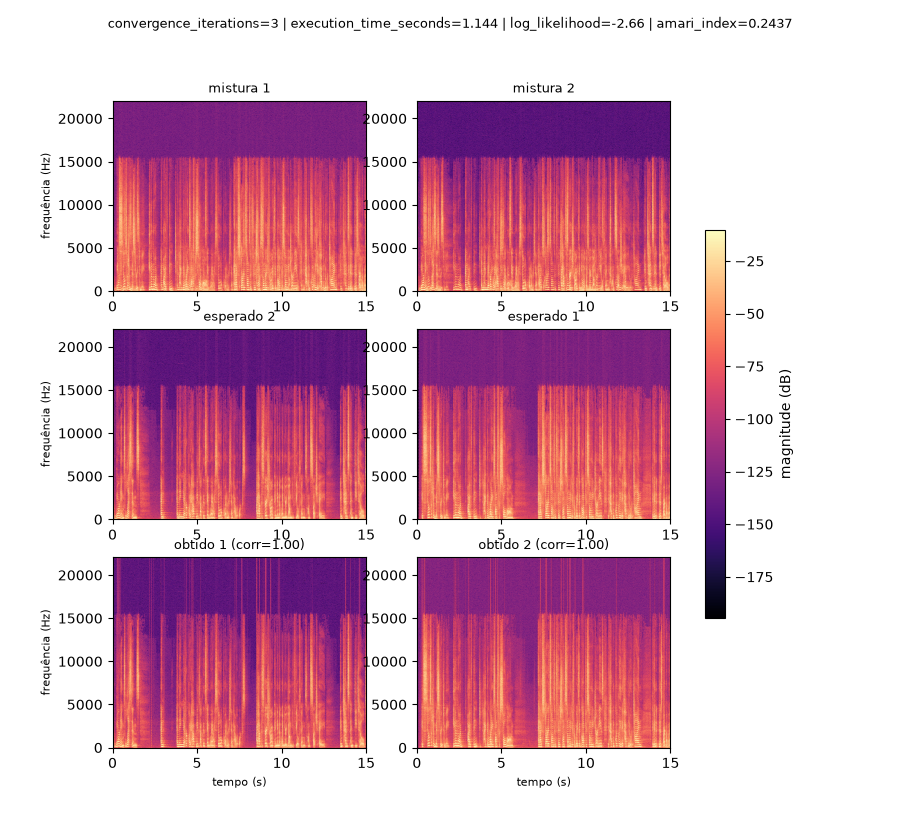

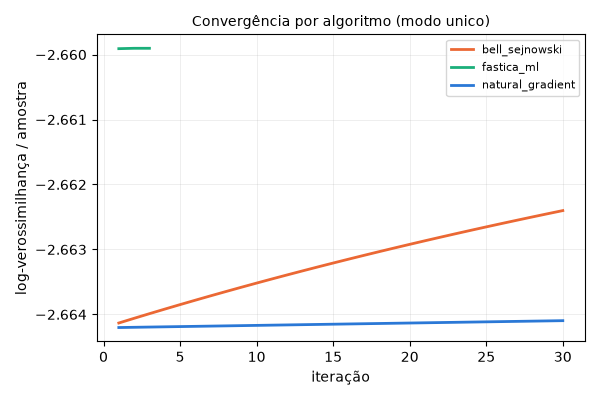

In [14]:
audio_run1 = run_and_show("audio", "run1", max_iterations=30)

### `audio/run2`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,187585.9638,0.0,39877.9907,0.0778,2.4087,4.7295e-02,False
2,2892.7181,0.0,395.7905,-0.0468,-0.1059,8.0268e-05,True
3,316828.7932,0.0,118254.2000,0.0822,4.2449,1.2529e-01,False


viabilidade=viavel (1/3 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0702 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0087
lags GCC-PHAT (amostras):
[[0 0 0]
 [0 0 0]
 [0 0 0]]


,família estimada,KS do ajuste
componente obtida,,
1,laplaciana,0.1276
2,laplaciana,0.0800
3,gaussiana,0.0098


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-2.6000,0.2829,30.0,47.8965
fastica_ml,unico,-4.1165,0.3247,30.0,48.9928
natural_gradient,unico,-2.6788,0.2991,30.0,47.8453


vencedor: bell_sejnowski/unico


,componente obtida,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,
1,1,18.1229,17.2172,17.2154
2,3,16.4095,16.3913,16.4051
3,2,20.1973,20.0657,20.0499


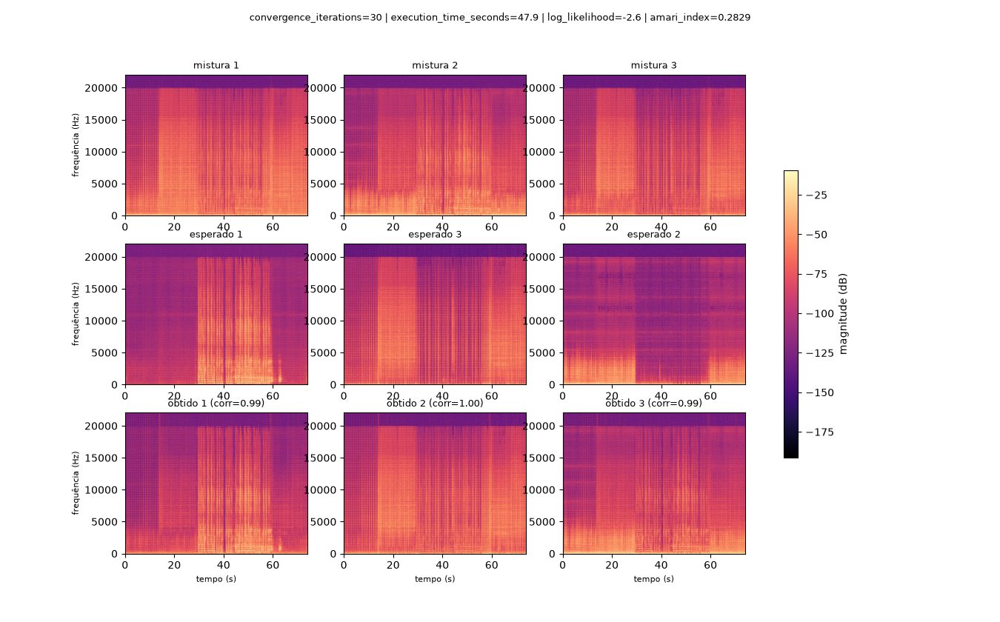

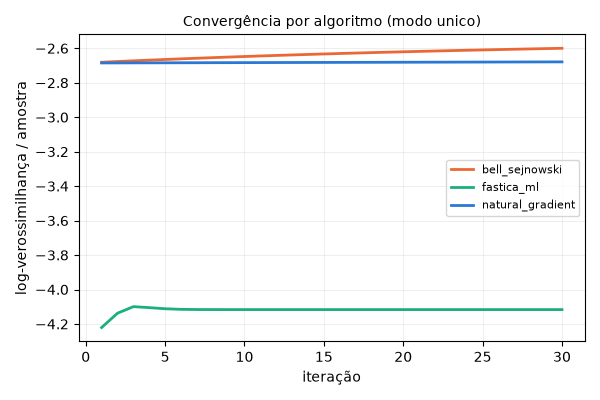

In [15]:
audio_run2 = run_and_show("audio", "run2", max_iterations=30)

### `audio/run3`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,19946.2117,0.0,2214.1811,0.0172,1.3967,0.0135,False
2,50286.5207,0.0,24774.3577,-0.0378,3.2445,0.0815,False


viabilidade=viavel (0/2 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0607 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0001
lags GCC-PHAT (amostras):
[[0 0]
 [0 0]]


,família estimada,KS do ajuste
componente obtida,,
1,laplaciana,0.0656
2,gaussiana,0.0121


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-2.7730,0.4571,30.0,8.1548
fastica_ml,unico,-2.7765,0.3266,5.0,1.4630
natural_gradient,unico,-2.7797,0.4596,30.0,9.7193


vencedor: bell_sejnowski/unico


,componente obtida,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,
1,1,17.3370,16.6871,16.6914
2,2,16.8495,15.2355,15.2311


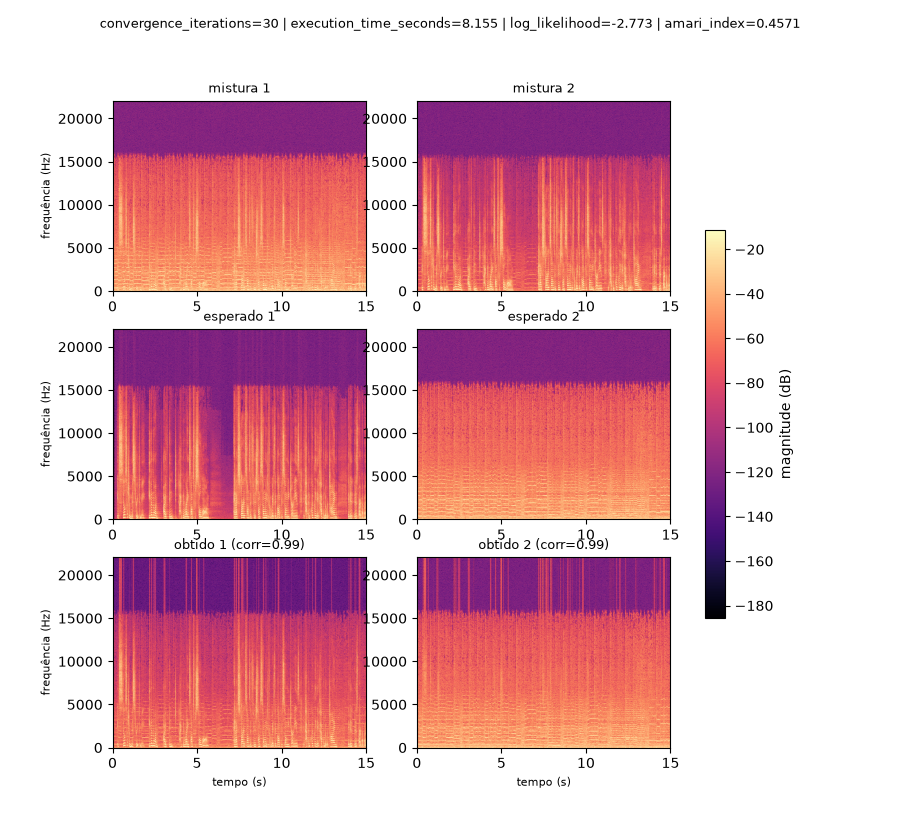

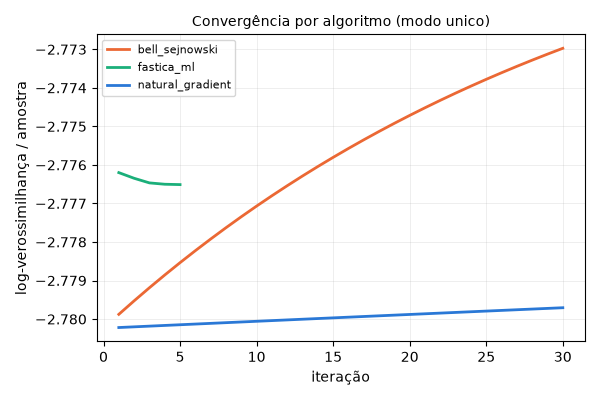

In [16]:
audio_run3 = run_and_show("audio", "run3", max_iterations=30)

### `audio/run4`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,52211.7500,0.0,21493.5305,-0.0337,3.3822,0.0799,False
2,32638.0745,0.0,8112.1693,0.0133,2.1217,0.0351,False


viabilidade=viavel (0/2 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0059 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0007
lags GCC-PHAT (amostras):
[[     0 -44100]
 [ 44100      0]]


,família estimada,KS do ajuste
componente obtida,,
1,laplaciana,0.1030
2,laplaciana,0.0994


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-2.7223,0.3695,30.0,10.3887
fastica_ml,unico,-2.6874,0.3633,3.0,0.8825
natural_gradient,unico,-2.7279,0.3779,30.0,7.8170


vencedor: fastica_ml/unico


,componente obtida,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,
1,1,46.0295,30.0853,30.0850
2,2,68.8893,24.7047,24.7047


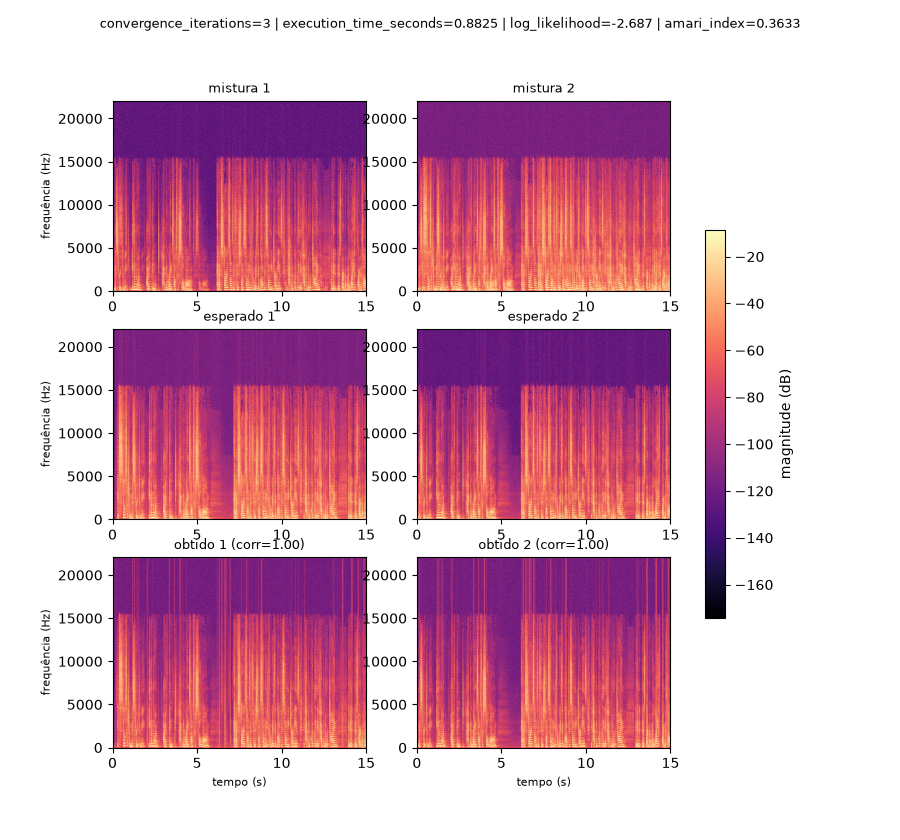

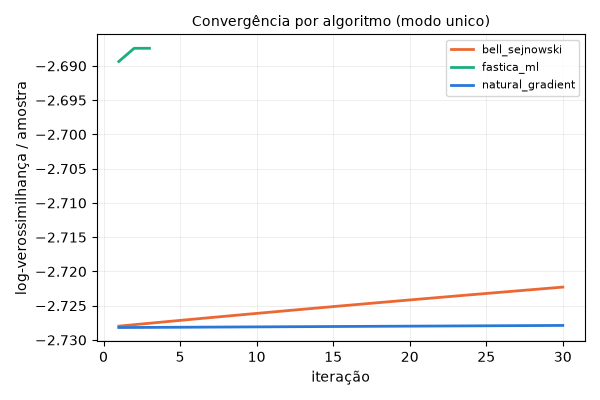

In [17]:
audio_run4 = run_and_show("audio", "run4", max_iterations=30)

### `audio/run5`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,721.0481,2.6693e-157,30.9505,-0.0085,0.1747,0.0002,True
2,3433.7194,0.0000e+00,192.1436,-0.0044,0.4256,0.0012,False


viabilidade=viavel (1/2 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0166 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0000
lags GCC-PHAT (amostras):
[[ 0 -6]
 [ 6  0]]


,família estimada,KS do ajuste
componente obtida,,
1,gaussiana,0.0181
2,gaussiana,0.0029


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-2.8439,0.1826,30.0,9.2961
fastica_ml,unico,-2.8553,0.0585,3.0,1.3194
natural_gradient,unico,-2.8563,0.1863,30.0,8.6549


vencedor: bell_sejnowski/unico


,componente obtida,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,
1,1,15.2289,-0.0775,-0.0828
2,2,14.1821,-0.5174,-0.5113


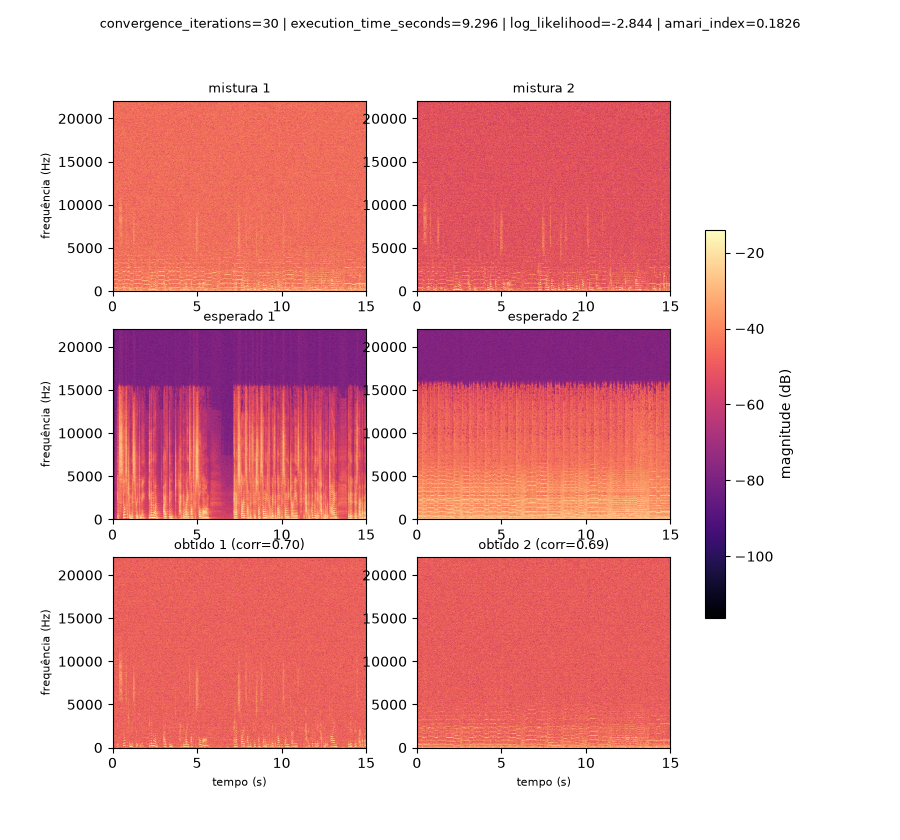

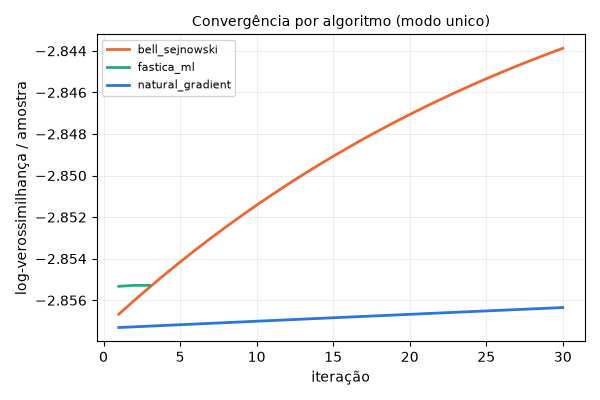

In [18]:
audio_run5 = run_and_show("audio", "run5", max_iterations=30)

### `audio/run6`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,9969.6081,0.0,690.8674,0.0008,0.8404,0.0045,False
2,28190.6223,0.0,4242.1599,-0.0265,1.8586,0.0244,False


viabilidade=viavel (0/2 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0053 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0000
lags GCC-PHAT (amostras):
[[0 0]
 [0 0]]


,família estimada,KS do ajuste
componente obtida,,
1,laplaciana,0.0262
2,gaussiana,0.0096


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-2.7793,0.0465,30.0,7.8711
fastica_ml,unico,-2.7860,0.0551,2.0,0.6018
natural_gradient,unico,-2.7860,0.0488,30.0,10.3419


vencedor: bell_sejnowski/unico


,componente obtida,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,
1,1,30.9809,11.0479,11.0488
2,2,25.9736,8.1887,8.1871


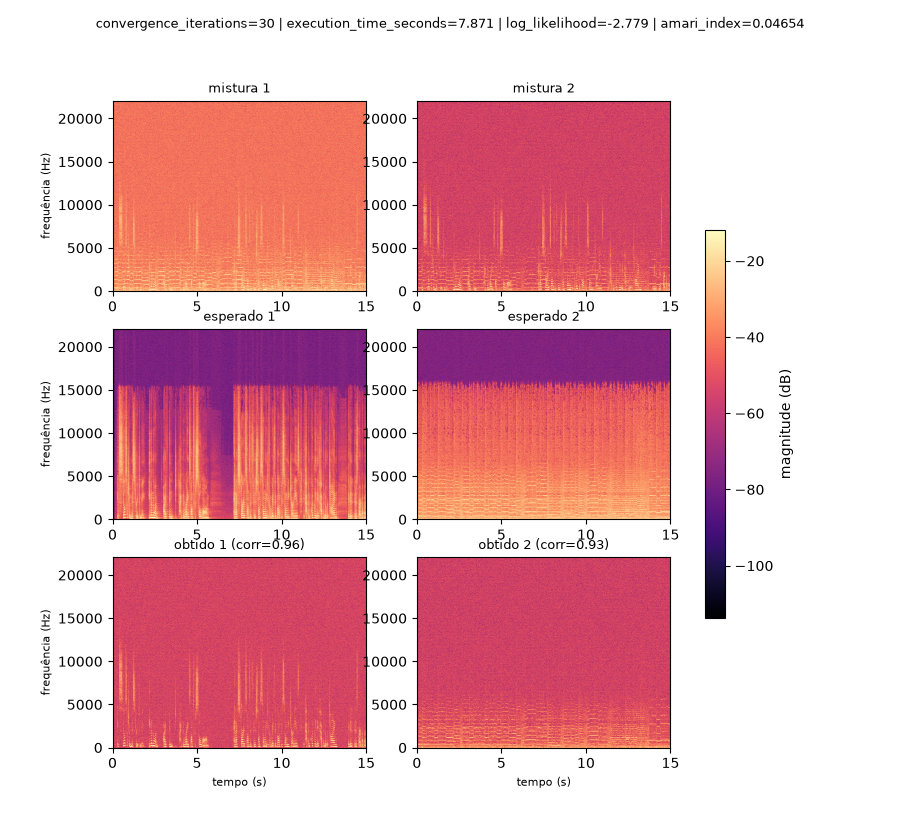

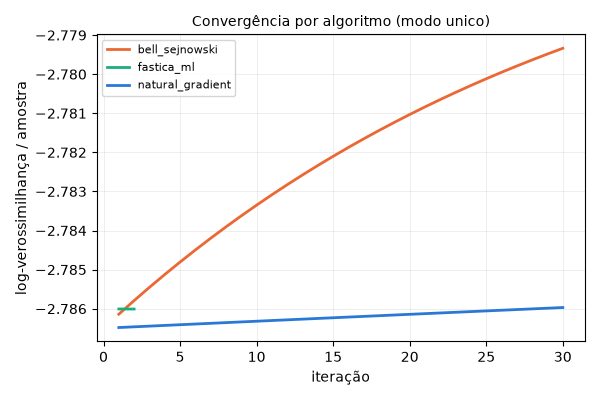

In [19]:
audio_run6 = run_and_show("audio", "run6", max_iterations=30)

### `audio/run7`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,22022.3912,0.0,2669.1255,0.0184,1.5119,0.0160,False
2,11225.3605,0.0,801.2059,-0.0012,0.9125,0.0052,False


viabilidade=viavel (0/2 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.0037 (ok)  |  defeito diag. conjunta (pré-ICA)=0.0001
lags GCC-PHAT (amostras):
[[0 0]
 [0 0]]


,família estimada,KS do ajuste
componente obtida,,
1,laplaciana,0.0776
2,gaussiana,0.0126


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-2.7711,0.2076,30.0,10.095
fastica_ml,unico,-2.7695,0.0463,3.0,1.006
natural_gradient,unico,-2.7788,0.2213,30.0,8.922


vencedor: fastica_ml/unico


,componente obtida,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,
1,1,77.9856,20.5101,20.5101
2,2,47.9498,19.3813,19.3812


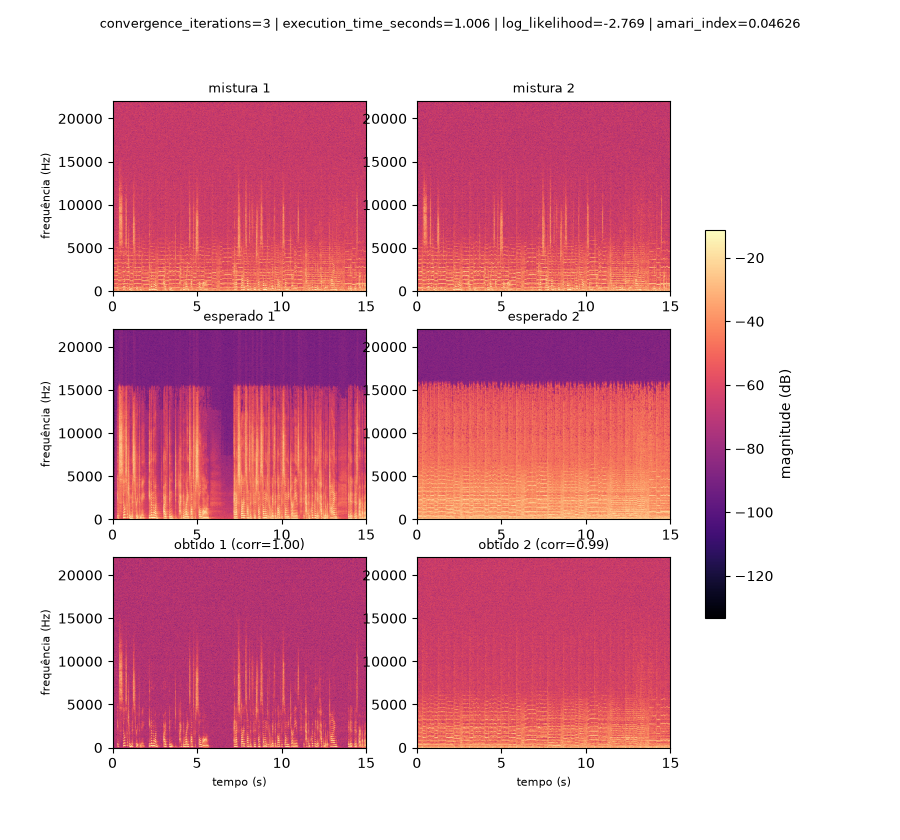

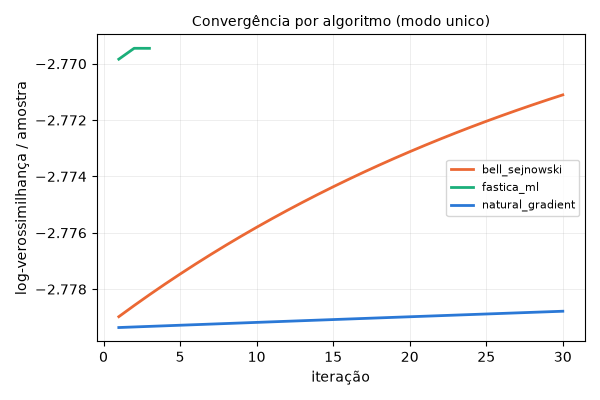

In [20]:
audio_run7 = run_and_show("audio", "run7", max_iterations=30)

### `audio/run8`

**Testes estatísticos (`assess/`) e classificação**

,K² (estat.),K² (p),AD (estat.),assimetria,curtose exced.,negentropia,aprox. gaussiana?
canal,,,,,,,
1,31486.5915,0.0,5501.8326,0.0257,2.0505,0.0304,False
2,6457.1560,0.0,228.9201,-0.0037,0.6298,0.0016,False


viabilidade=viavel (0/2 aprox. gaussianas)  |  não-linearidade (pós-ICA): max_dep=0.3789 (suspeita)  |  defeito diag. conjunta (pré-ICA)=0.0001
lags GCC-PHAT (amostras):
[[0 0]
 [0 0]]


,família estimada,KS do ajuste
componente obtida,,
1,laplaciana,0.0290
2,gaussiana,0.0185


**Resultados e comparação de métricas**

,,log-L/amostra,Amari,iterações,tempo (s)
algoritmo,modo,,,,
bell_sejnowski,unico,-2.8125,0.5057,30.0,8.4088
fastica_ml,unico,-2.8252,0.5249,13.0,3.8496
natural_gradient,unico,-2.8226,0.4976,30.0,10.7032


vencedor: bell_sejnowski/unico


,componente obtida,SIR (dB),SDR (dB),SI-SDR (dB)
fonte esperada,,,,
1,1,2.1449,2.1377,2.1620
2,2,1.4930,1.4307,1.4046


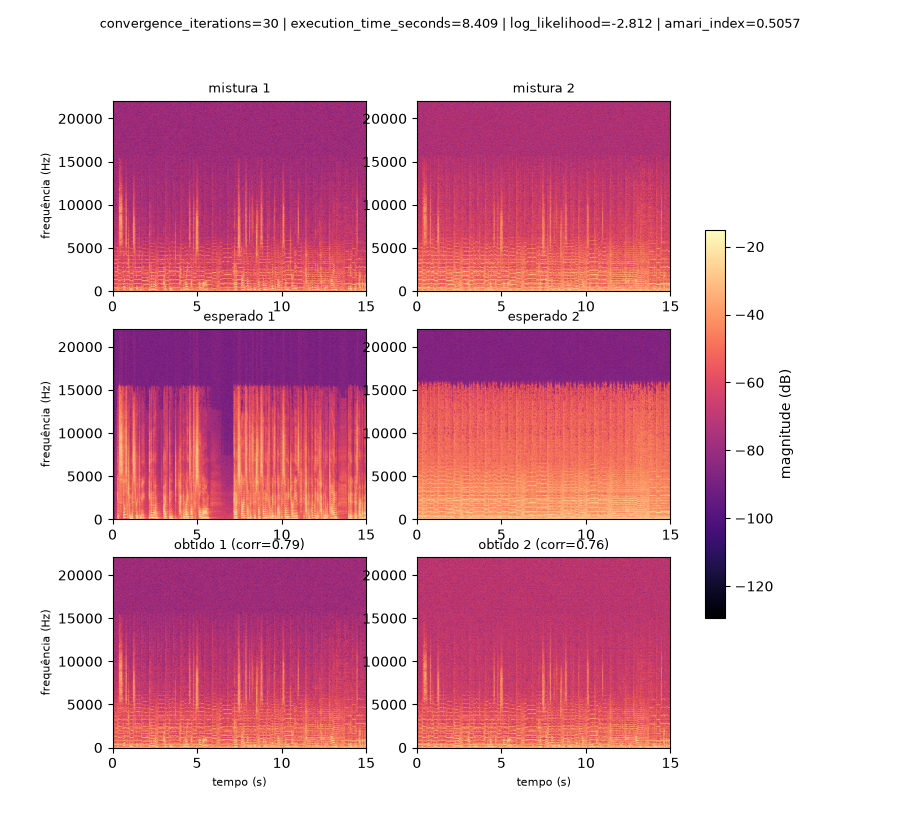

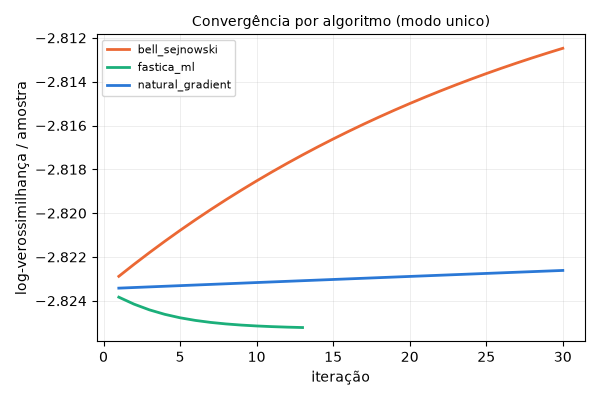

In [21]:
audio_run8 = run_and_show("audio", "run8", max_iterations=30)

## Comparação final: algoritmo vencedor por run

In [22]:
all_results = {
    "imagens/run1": imagens_run1,
    "imagens/run3": imagens_run3,
    **{f"dist/{r}": globals()[f"dist_{r}"] for r in ['run1', 'run2', 'run3', 'run4', 'run5', 'run6', 'run7', 'run8', 'run9']},
    **{f"audio/{r}": globals()[f"audio_{r}"] for r in ['run1', 'run2', 'run3', 'run4', 'run5', 'run6', 'run7', 'run8']},
}

summary_rows = []
for label, (winner, _cells) in all_results.items():
    summary_rows.append({
        "run": label,
        "vencedor": f"{winner.algorithm}/{winner.mode}",
        "log-L/amostra": winner.log_likelihood_per_sample,
        "Amari": winner.metrics.get("amari_index"),
    })
display(pd.DataFrame(summary_rows).set_index("run"))

,vencedor,log-L/amostra,Amari
run,,,
imagens/run1,bell_sejnowski/A,-2.7844,0.2129
imagens/run3,bell_sejnowski/C,-1.3590,NaN
dist/run1,bell_sejnowski/unico,-2.7714,0.2081
dist/run2,bell_sejnowski/unico,0.0233,0.2681
dist/run3,bell_sejnowski/unico,0.0257,0.2724
dist/run4,bell_sejnowski/unico,-5.5774,0.2402
dist/run5,fastica_ml/unico,-3.0117,0.4420
dist/run6,bell_sejnowski/unico,0.3244,NaN
dist/run7,bell_sejnowski/unico,-4.1430,0.3832
